# Dexamethasone Treated A549 Lung Cancer Cell Line (Cao et al.)

Data: [GSE117089](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE117089)

Article [Joint profiling of chromatin accessibility and gene expression in thousands of single cells](https://doi.org/10.1126/science.aau0730)

In [1]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
import pickle as pkl
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats
import seaborn as sns
import pickle as pkl
from scipy.io import mmread

sc.settings.verbosity = 3

In [2]:
import sys
sys.path.insert(0,'..')
import scmer

## Data Preparation

In [3]:
def read_data(path):
    adata = sc.read_mtx(path + "_gene_count.txt.gz").T
    adata.obs = pd.read_csv(path + "_cell.txt.gz", index_col=0, compression='gzip')
    adata.var = pd.read_csv(path + "_gene.txt.gz", index_col=0, compression='gzip')
    return adata

coassay_adata = read_data("../../sci-car/GSM3271040_RNA_sciCAR_A549")
coassay_adata = coassay_adata[coassay_adata.obs.cell_name == 'A549', coassay_adata.var.index.str.contains('^ENSG')]

rna_only_adata = read_data("../../sci-car/GSM3271042_RNA_only_A549")
rna_only_adata = rna_only_adata[:, rna_only_adata.var.index.str.contains('^ENSG')]

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [4]:
print(coassay_adata)
print(rna_only_adata)

View of AnnData object with n_obs × n_vars = 4277 × 63568
    obs: 'cell_name', 'experiment', 'treatment_time'
    var: 'gene_type', 'gene_short_name'
View of AnnData object with n_obs × n_vars = 1873 × 63568
    obs: 'cell_name', 'experiment', 'treatment_time'
    var: 'gene_type', 'gene_short_name'


In [5]:
adata = sc.concat(adatas=[coassay_adata, rna_only_adata])
adata

AnnData object with n_obs × n_vars = 6150 × 63568
    obs: 'cell_name', 'experiment', 'treatment_time'

In [6]:
adata.obs['treatment_time'] = adata.obs['treatment_time'].astype(int).astype(str)
adata.obs

,cell_name,experiment,treatment_time
sample,,,
sci-RNA-A-001.AAGTACGTTA,A549,coassay,3
sci-RNA-A-001.TCTCTCATCC,A549,coassay,0
sci-RNA-A-001.TCCGCCGGTC,A549,coassay,3
sci-RNA-A-001.TTCTATAGAG,A549,coassay,1
sci-RNA-A-001.CGTCTATGAA,A549,coassay,1
...,...,...,...
co-RNA-only-192.TTCGCTGCCT,A549,RNA_only,1
co-RNA-only-192.TTCTCTACTA,A549,RNA_only,1
co-RNA-only-192.TTGCAGCATT,A549,RNA_only,1


In [7]:
adata.var['gene_type'] = coassay_adata.var.gene_type
adata.var['gene_short_name'] = coassay_adata.var.gene_short_name

In [8]:
adata.var.gene_type.value_counts().to_frame("Counts")

,Counts
protein_coding,22705
pseudogene,15588
lincRNA,7335
antisense,5478
miRNA,3367
misc_RNA,2175
snRNA,2067
snoRNA,1549
processed_transcript,814
sense_intronic,767


In [9]:
def make_unique(x):
    d = {}
    r = []
    for i in x:
        if i in d:
            d[i] += 1
            r.append(i + '__' + str(d[i]))
            # print(i, '->', r[-1], sep='\t')
        else:
            d[i] = 1
            r.append(i)
    return r

adata.var['gene'] = make_unique(adata.var.gene_short_name)

In [10]:
adata.var

,gene_type,gene_short_name,gene
gene_id,,,
ENSG00000223972.4,pseudogene,DDX11L1,DDX11L1
ENSG00000227232.4,pseudogene,WASH7P,WASH7P
ENSG00000243485.2,lincRNA,MIR1302-11,MIR1302-11
ENSG00000237613.2,lincRNA,FAM138A,FAM138A
ENSG00000268020.2,pseudogene,OR4G4P,OR4G4P
...,...,...,...
ENSG00000241559.2,miRNA,CU459202.2,CU459202.2
ENSG00000264728.1,miRNA,CU442762.3,CU442762.3
ENSG00000238667.1,miRNA,CU442762.2,CU442762.2


In [11]:
adata.var['gene_id'] = adata.var.index
adata.var.index = adata.var['gene']

## SCANPY Analysis

normalizing counts per cell
    finished (0:00:00)


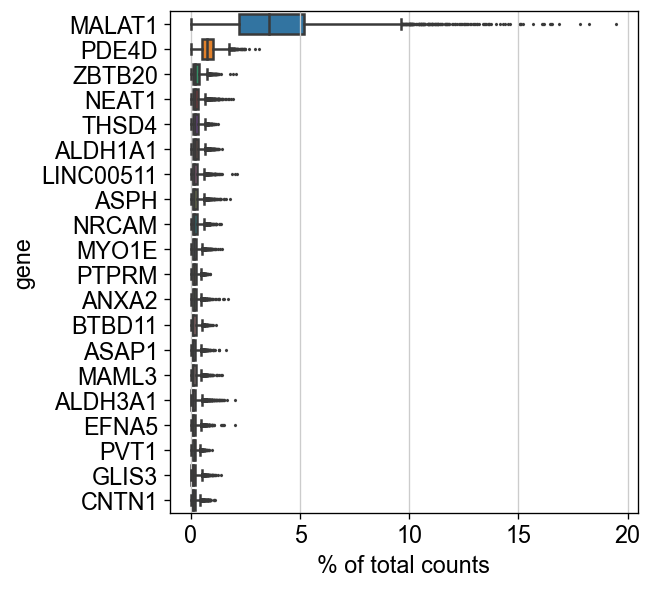

In [12]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.highest_expr_genes(adata, n_top=20)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cell_name' as categorical
... storing 'experiment' as categorical
... storing 'treatment_time' as categorical
... storing 'gene_type' as categorical
... storing 'gene_short_name' as categorical
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\seaborn\_core.py:1303: UserWarning: Verti

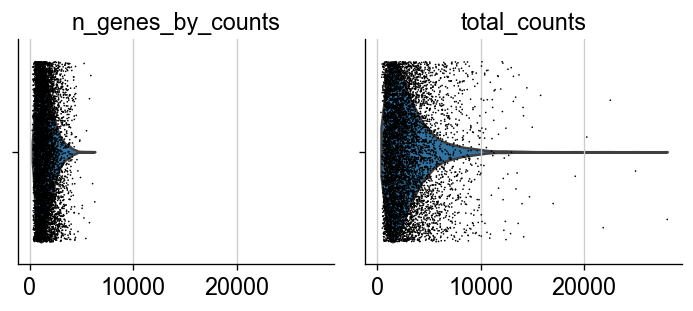

In [13]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'], jitter=0.4, multi_panel=True)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


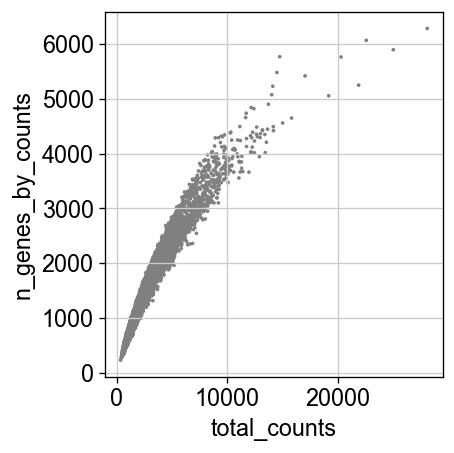

In [14]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [15]:
adata = adata[(adata.obs.total_counts >= 500) & (adata.obs.total_counts <= 9100), :]

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [16]:
# adata = adata[:, adata.var.gene_type == "protein_coding"]
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

Trying to set attribute `.obs` of view, copying.


filtered out 34379 genes that are detected in less than 3 cells


In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [18]:
sc.pp.highly_variable_genes(adata)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


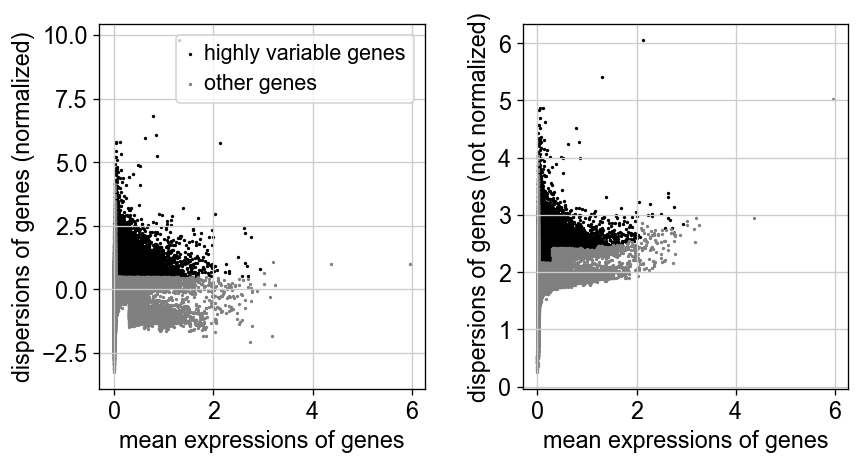

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
adata.raw = adata

In [21]:
adata = adata[:, adata.var.highly_variable]

In [22]:
sc.pp.regress_out(adata, ['total_counts'])

regressing out ['total_counts']
    sparse input is densified and may lead to high memory use


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished (0:00:29)


In [23]:
sc.pp.scale(adata, max_value=10)
adata

AnnData object with n_obs × n_vars = 6012 × 6850
    obs: 'cell_name', 'experiment', 'treatment_time', 'n_genes_by_counts', 'total_counts', 'n_genes'
    var: 'gene_type', 'gene_short_name', 'gene', 'gene_id', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [24]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:04)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


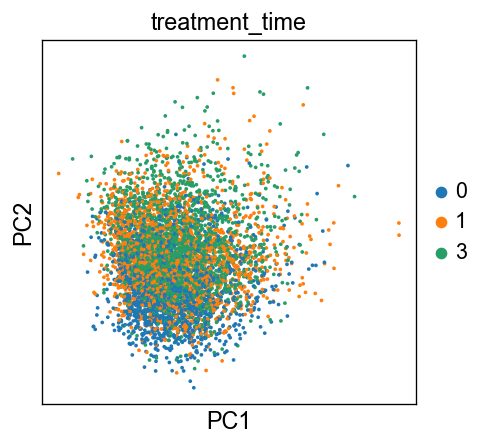

In [25]:
sc.pl.pca(adata, color=['treatment_time'])

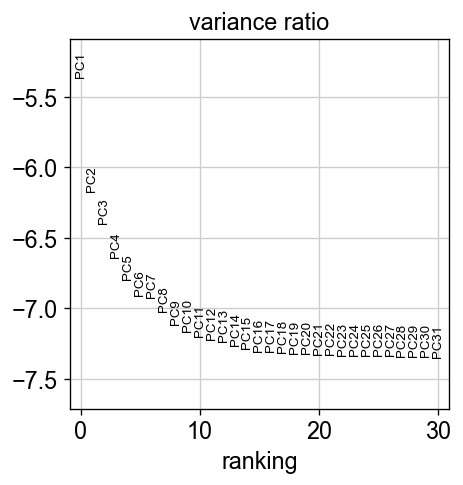

In [26]:
sc.pl.pca_variance_ratio(adata, log=True)

computing neighbors
    using 'X_pca' with n_pcs = 25
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


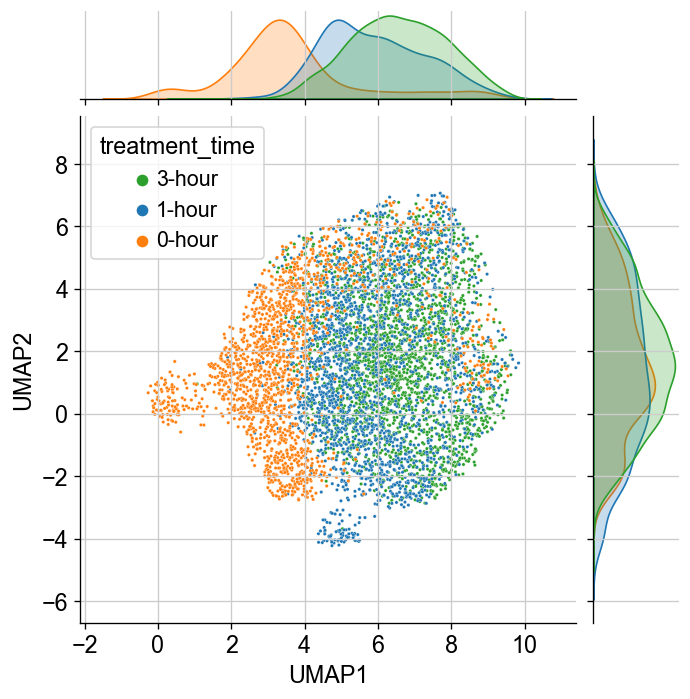

In [27]:
sc.pp.neighbors(adata, n_pcs=25)
sc.tl.umap(adata)

df = pd.DataFrame(adata.obsm['X_umap'], columns=['UMAP1', 'UMAP2'])
df['treatment_time'] = [i + '-hour' for i in adata.obs['treatment_time'].tolist()]
    
sns.jointplot(data=df.sort_values(by='treatment_time', ascending=False), x="UMAP1", y="UMAP2", hue="treatment_time", s=4,
             palette=[sns.color_palette("tab10")[i] for i in [2, 0, 1]])

## SCMER Feature Selection

In [28]:
model = scmer.UmapL1(w=1., lasso=1e-4, ridge=1e-4, n_pcs=25, perplexity=100., use_beta_in_Q=True, n_threads=6, 
                             max_outer_iter=2)
model.fit(adata.X)


Calculating distance matrix and scaling factors...
Computing pairwise distances...
Using 6 threads...
Mean value of sigma: 0.753229
Done. Elapsed time: 28.75 seconds. Total: 28.75 seconds.
Creating model without batches...
Optimizing using OWLQN (because lasso is nonzero)...
0 loss: 5.043517112731934 Nonzero: 80 Elapsed time: 172.02 seconds. Total: 200.76 seconds.
1 loss: 3.550537586212158 Nonzero: 80 Elapsed time: 178.25 seconds. Total: 379.01 seconds.
final loss: 3.5436885356903076 Nonzero: 80 Elapsed time: 2.73 seconds. Total: 381.74 seconds.


## Validation

### PCA and UMAP

In [29]:
new_adata = model.transform(adata)
new_adata

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 6012 × 80
    obs: 'cell_name', 'experiment', 'treatment_time', 'n_genes_by_counts', 'total_counts', 'n_genes'
    var: 'gene_type', 'gene_short_name', 'gene', 'gene_id', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'treatment_time_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


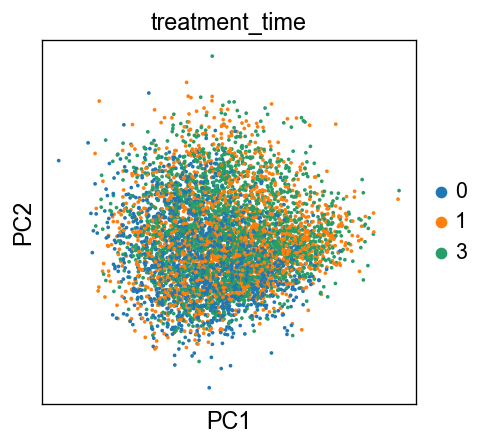

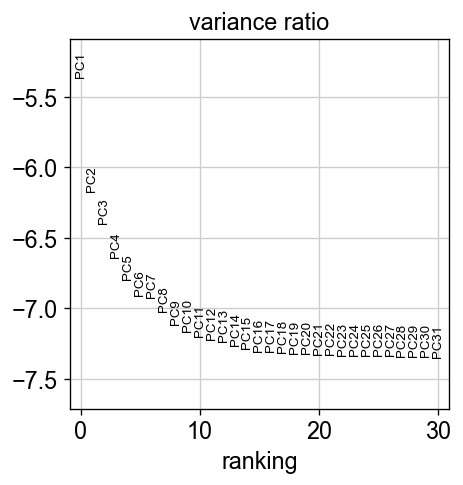

In [30]:
sc.tl.pca(new_adata, svd_solver='arpack')
sc.pl.pca(new_adata, color=['treatment_time'])
sc.pl.pca_variance_ratio(adata, log=True)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


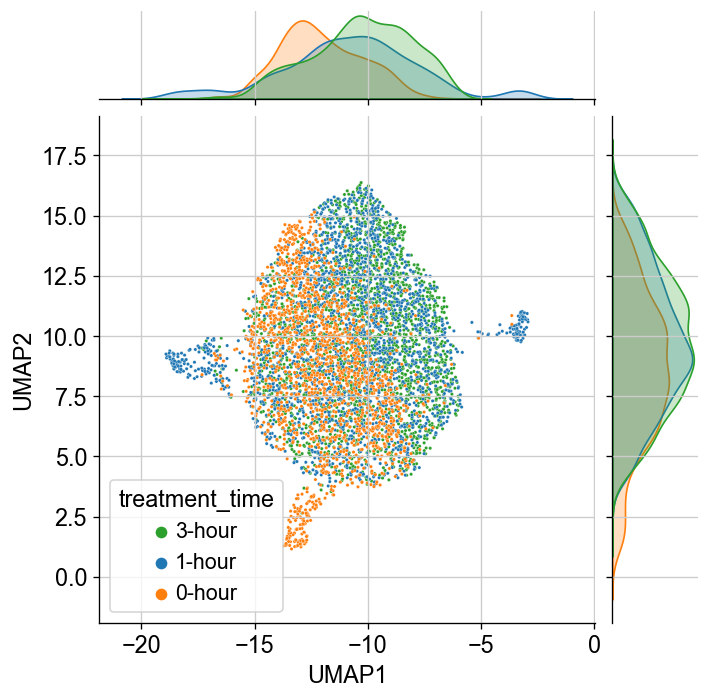

In [31]:
sc.pp.neighbors(new_adata, n_pcs=10, use_rep="X_pca")
sc.tl.umap(new_adata)

df = pd.DataFrame(new_adata.obsm['X_umap'], columns=['UMAP1', 'UMAP2'])
df['treatment_time'] = [i + '-hour' for i in new_adata.obs['treatment_time'].tolist()]
df['UMAP1'] = -df['UMAP1']
sns.jointplot(data=df.sort_values(by='treatment_time', ascending=False), x="UMAP1", y="UMAP2", hue="treatment_time", s=4, 
              palette=[sns.color_palette("tab10")[i] for i in [2, 0, 1]])

### Scatter Plot for All Genes Chosen by SCMER

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


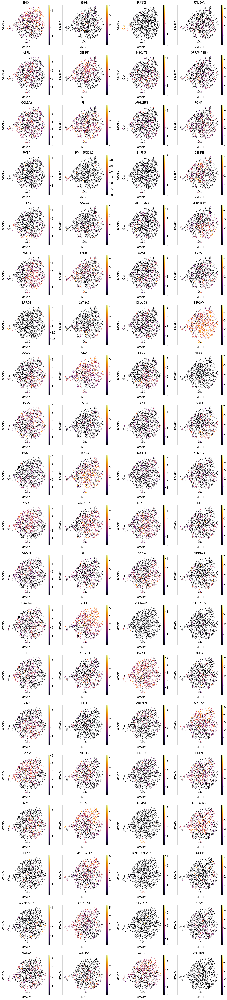

In [32]:
sc.pl.umap(adata, color=adata.var_names[model.get_mask()].tolist(), legend_loc='on data', size=5., color_map='inferno')

### Consensus of RNA and ATAC manifold

In [33]:
atac_df = pd.read_pickle("../notebooks/a549-atac-umap.pkl")

In [34]:
common_cells = list(set(atac_df.index.tolist()).intersection(adata.obs_names.tolist()))
len(common_cells)

1434

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


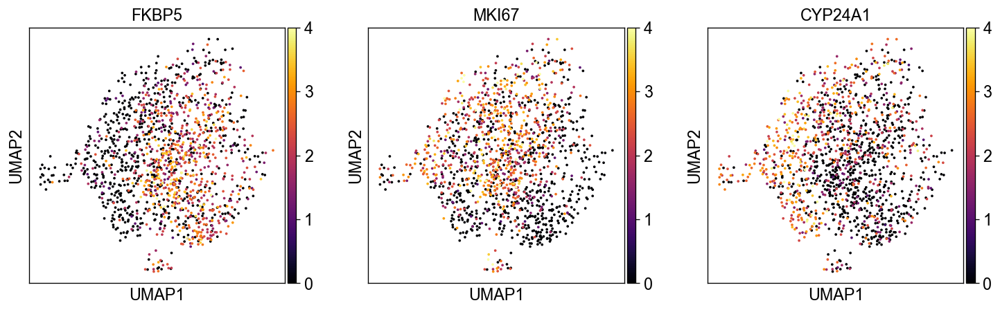

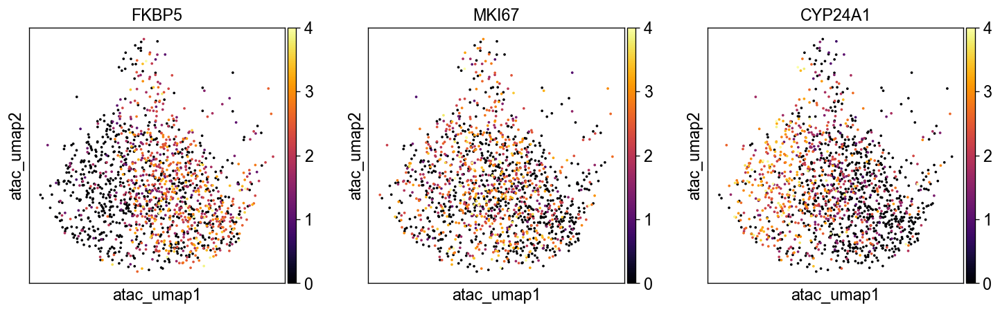

In [35]:
common_adata = adata[common_cells, :]
common_adata.obsm['X_atac_umap'] = atac_df.loc[common_cells, ['UMAP1', 'UMAP2']].values
sc.pl.embedding(common_adata, 'umap', color=['FKBP5', 'MKI67', 'CYP24A1'], legend_loc='on data', size=20., ncols=3, 
                color_map='inferno', vmax=4)
sc.pl.embedding(common_adata, 'atac_umap', color=['FKBP5', 'MKI67', 'CYP24A1'], legend_loc='on data', size=20., ncols=3, 
                color_map='inferno', vmax=4)

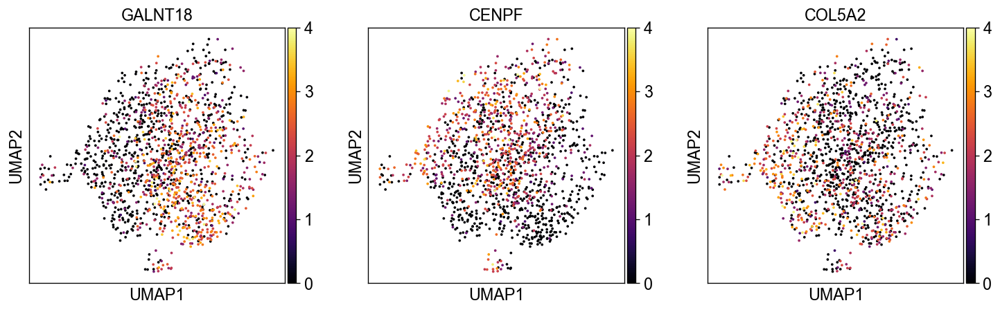

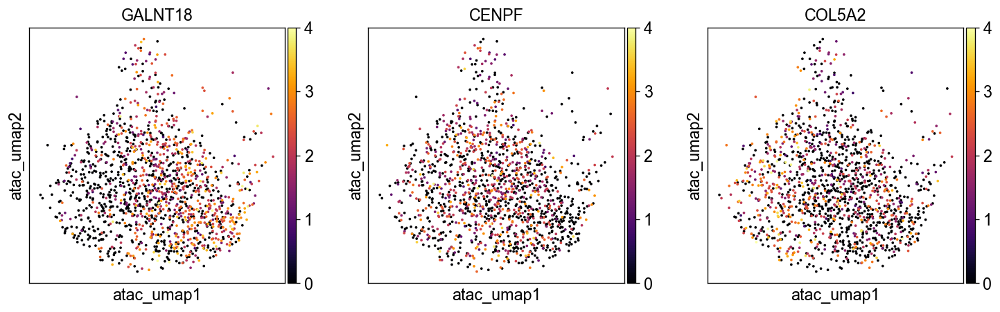

In [36]:
common_adata = adata[common_cells, :]
common_adata.obsm['X_atac_umap'] = atac_df.loc[common_cells, ['UMAP1', 'UMAP2']].values
sc.pl.embedding(common_adata, 'umap', color=['GALNT18', 'CENPF', 'COL5A2'], legend_loc='on data', size=20., ncols=3, 
                color_map='inferno', vmax=4)
sc.pl.embedding(common_adata, 'atac_umap', color=['GALNT18', 'CENPF', 'COL5A2'], legend_loc='on data', size=20., ncols=3, 
                color_map='inferno', vmax=4)

### Correlation with TFs

In [37]:
tf = pd.read_csv("../../sci-car/gold_standard_tf.csv", index_col=0).T
tf = tf.loc[common_cells, :]

In [38]:
import scipy.stats

In [39]:
corr_df = pd.DataFrame([np.corrcoef(np.array(common_adata[:, g].X).squeeze(), tf['MA0113.3_NR3C1'])[0, 1] for g in adata.var_names], 
                         index=adata.var_names, columns=['Correlation'])

Among all the genes, _FKBP5_ and _CYP24A1_ are the most correlated with the activity of NR3C1 TF, a major target of DEX.

In [40]:
corr_df['score'] = model.w
corr_df.sort_values(by='Correlation', ascending=False)

,Correlation,score
gene,,
FKBP5,0.355375,1.584072
GALNT18,0.255927,0.888890
NRCAM,0.235787,1.165094
SYBU,0.201692,0.845990
PLEKHA7,0.201616,0.848208
...,...,...
KIFC3,-0.192754,0.000000
MAP3K14,-0.208078,0.000000
COL5A2,-0.218765,0.913006


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


Text(0.5, 0, 'FKBP5 expression')

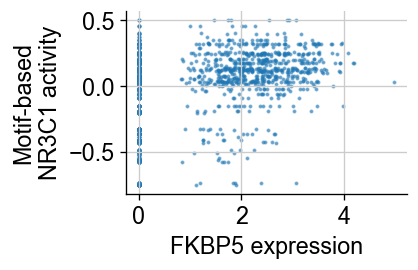

In [41]:
g = 'FKBP5'
fig = plt.figure(figsize=(3, 2))
plt.scatter(np.array(common_adata.raw.to_adata()[:, g].X.todense()).squeeze(), tf['MA0113.3_NR3C1'], s=2., alpha=.5)
fig.axes[0].spines['right'].set_visible(False)
fig.axes[0].spines['top'].set_visible(False)
plt.ylabel("Motif-based\nNR3C1 activity")
plt.xlabel("FKBP5 expression")

Text(0.5, 0, 'CYP24A1 expression')

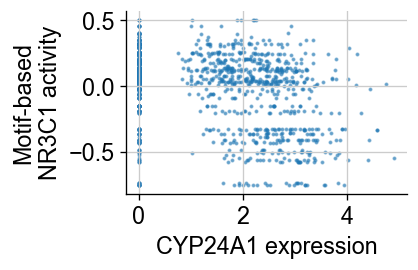

In [42]:
g = 'CYP24A1'
fig = plt.figure(figsize=(3, 2))
plt.scatter(np.array(common_adata.raw.to_adata()[:, g].X.todense()).squeeze(), tf['MA0113.3_NR3C1'], s=2., alpha=.5)
fig.axes[0].spines['right'].set_visible(False)
fig.axes[0].spines['top'].set_visible(False)
plt.ylabel("Motif-based\nNR3C1 activity")
plt.xlabel("CYP24A1 expression")

The most correlated genes are recalled by SCMER.

In [43]:
corr_df[corr_df.score>0.].sort_values(by='score', ascending=False).style

,Correlation,score
gene,,
MKI67,0.005315,2.196719
CENPF,0.012876,2.181099
TOP2A,0.005913,2.103136
KRT81,0.009329,1.925768
LINC00669,-0.026802,1.848227
SLC7A5,-0.033285,1.672786
ACTG1,-0.006641,1.635077
FKBP5,0.355375,1.584072
CYP24A1,-0.365414,1.473135


In [44]:
corr_df[corr_df.score>0.].sort_values(by='Correlation', ascending=False).style

,Correlation,score
gene,,
FKBP5,0.355375,1.584072
GALNT18,0.255927,0.888890
NRCAM,0.235787,1.165094
SYBU,0.201692,0.845990
PLEKHA7,0.201616,0.848208
EPB41L4A,0.180805,1.057562
FRMD3,0.179904,0.998225
SDK2,0.174713,0.827627
DOCK4,0.161354,0.876944


MKI67, an important cell cycle marker, is uncorrelated with NR3C1.

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


Text(0.5, 0, 'CYP24A1 expression')

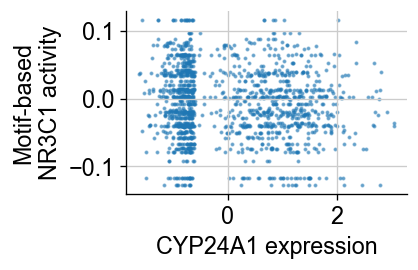

In [45]:
g = 'MKI67'

fig = plt.figure(figsize=(3, 2))
plt.scatter(np.array(common_adata[:, g].X).squeeze(), tf['MA0106.3_TP53'], s=2., alpha=.5)
fig.axes[0].spines['right'].set_visible(False)
fig.axes[0].spines['top'].set_visible(False)
plt.ylabel("Motif-based\nNR3C1 activity")
plt.xlabel("CYP24A1 expression")

In [46]:
corr_df2 = pd.DataFrame([np.corrcoef(np.array(common_adata[:, 'MKI67'].X).squeeze(), tf[t])[0, 1] for t in tf.columns], 
                         index=tf.columns, columns=['Correlation'])
corr_df2.sort_values(by="Correlation")

,Correlation
MA0106.3_TP53,-0.098055
MA0665.1_MSC,-0.091495
MA0698.1_ZBTB18,-0.088254
MA0148.3_FOXA1,-0.087623
MA0140.2_GATA1::TAL1,-0.085941
...,...
MA0773.1_MEF2D,0.096405
MA0749.1_ZBED1,0.097567
MA0788.1_POU3F3,0.099256
MA0862.1_GMEB2,0.107898
